# Use Librosa to generate some Mel Spectrograms!
### Maybe use these to train an ImageNet...

#### This version generates images directly (not using matplotlib) - much faster!
* Generating complete data set this time...

In [10]:
import os

import pandas as pd
import numpy as np

import librosa
import librosa.display

from IPython.display import Audio

from PIL import Image, ImageOps

import matplotlib.cm as cm

In [11]:
# Whether to display the full spectrogram or just the 5s clip
dispFull = False

# Whether to normalise the spectrogram to the full range of the image, or just the 5s clip
normaliseFull = False

# File paths

In [12]:
audio_input_folder = "../Data/birdclef-2024/train_audio"
image_output_folder = "../Data/8kHz_spec_images"
meta_data = pd.read_csv("../Data/birdclef-2024/eBird_Taxonomy_v2021.csv")



In [13]:
birds_of_interest = [
    "Eurasian Coot", #
    "Blyth's Reed Warbler", #
    "Gray Heron", #
    "Greenish Warbler", #
    "Black-crowned Night-Heron", #, 
    "Rose-ringed Parakeet", #
    "Greater Racket-tailed Drongo", #
    "White-breasted Waterhen", #
    "Gray-headed Canary-Flycatcher", #
    "Great Egret", #
    "Little Egret", #
    "Red-whiskered Bulbul"#
]

print(len(birds_of_interest))

12


In [14]:
metadata_of_interest = meta_data[meta_data['PRIMARY_COM_NAME'].isin(birds_of_interest)]
print(metadata_of_interest.shape)
metadata_of_interest

(12, 9)


,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
2753,5346,species,eurcoo,Eurasian Coot,Fulica atra,Gruiformes,"Rallidae (Rails, Gallinules, and Coots)",NaN,NaN
2797,5407,species,whbwat1,White-breasted Waterhen,Amaurornis phoenicurus,Gruiformes,"Rallidae (Rails, Gallinules, and Coots)",NaN,NaN
4013,7176,species,graher1,Gray Heron,Ardea cinerea,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN
4030,7200,species,greegr,Great Egret,Ardea alba,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN
4045,7217,species,litegr,Little Egret,Egretta garzetta,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN
4095,7305,species,bcnher,Black-crowned Night-Heron,Nycticorax nycticorax,Pelecaniformes,"Ardeidae (Herons, Egrets, and Bitterns)",NaN,NaN
6335,11807,species,rorpar,Rose-ringed Parakeet,Psittacula krameri,Psittaciformes,Psittaculidae (Old World Parrots),NaN,NaN
10079,19754,species,grtdro1,Greater Racket-tailed Drongo,Dicrurus paradiseus,Passeriformes,Dicruridae (Drongos),NaN,NaN
10670,21121,species,gyhcaf1,Gray-headed Canary-Flycatcher,Culicicapa ceylonensis,Passeriformes,Stenostiridae (Fairy Flycatchers),NaN,NaN
11263,22828,species,blrwar1,Blyth's Reed Warbler,Acrocephalus dumetorum,Passeriformes,Acrocephalidae (Reed Warblers and Allies),NaN,NaN


# Settings

In [15]:
#generates spectrograms are generated on audio clips this long
#audio clips shorter than this are ignored
audio_duration = 5.0

#generates up to this many clips per file (multiples of audio_duration)
#remainders of audio clip length / audio_duration are ignored
max_clips_per_audio_file = 40

#image size (image_size x image_size)
image_size = 224

#processes up to this many audio files per species
max_audio_input_per_species = 1000

#setting this above 0 will cause processing to start at a folder after the first
#useful for restarting / continuing in case of running out of time / crash (folders are processed alphabetically)
start_at_folder_offset = 0

# Function to lookup bird species

In [16]:
# ORIGINAL VER
# def bird_species_from_folder(path):
#     if path.endswith('/'):
#         path = path[:-1]

#     last_folder = os.path.basename(path)
#     primary_com_name = meta_data.loc[meta_data['SPECIES_CODE'] == last_folder, 'PRIMARY_COM_NAME']
#     primary_com_name_str = primary_com_name.iloc[0] if not primary_com_name.empty else ''    
#     return f"{primary_com_name_str} ({last_folder})"

def bird_species_from_folder(path):
    if path.endswith('/'):
        path = path[:-1]

    last_folder = os.path.basename(path)
    primary_com_name = metadata_of_interest.loc[metadata_of_interest['SPECIES_CODE'] == last_folder, 'PRIMARY_COM_NAME']
    primary_com_name_str = primary_com_name.iloc[0] if not primary_com_name.empty else ''    
    return f"{primary_com_name_str} ({last_folder})"

In [17]:
def spectrograms_for_audio(dirname, filename, preview=False):
    # Calculate total duration of the audio file
    audio_path = os.path.join(dirname, filename)
    audio_data, sr = librosa.load(audio_path, sr=None)
    total_duration = librosa.get_duration(path=audio_path)
    
    # Determine how many full segments of audio_duration fit in the audio file
    num_segments = int(total_duration // audio_duration)
    if num_segments == 0: return 0
    if num_segments > max_clips_per_audio_file: num_segments = max_clips_per_audio_file
    
    if normaliseFull:
        SFull = librosa.feature.melspectrogram(y=audio_data, sr=sr, n_mels=512, fmax=8000)
        S_dbFull = librosa.amplitude_to_db(SFull, ref=np.max(SFull))
        #convert spectrogram data into directly into image (much faster than matplotlib)
        normalized_arrayFull = (S_dbFull - np.min(S_dbFull)) / ((np.max(S_dbFull) - np.min(S_dbFull)))
        spectrogram_imageFull = cm.jet(normalized_arrayFull)[:, :, :3]
        spectrogram_imageFull = (spectrogram_imageFull * 255).astype(np.uint8)
        spectrogram_imageFull = Image.fromarray(spectrogram_imageFull)
    
    for segment in range(num_segments):

        offset_samples = int(segment * audio_duration * sr)
        end_samples = int(offset_samples + audio_duration * sr)
        
        segment_data = audio_data[offset_samples:end_samples]
        
        S = librosa.feature.melspectrogram(y=segment_data, sr=sr, n_mels=512, fmax=8000)
        if normaliseFull:
            S_db = librosa.amplitude_to_db(S, ref=np.max(SFull))
        else:
            S_db = librosa.amplitude_to_db(S, ref=np.max(S))
                
        #convert spectrogram data into directly into image (much faster than matplotlib)
        if normaliseFull:
            normalized_array = (S_db - np.min(S_dbFull)) / ((np.max(S_dbFull) - np.min(S_dbFull)))
        else:
            normalized_array = (S_db - np.min(S_db)) / ((np.max(S_db) - np.min(S_db)))
        
        #set color mapping 
#         spectrogram_image = cm.magma(normalized_array)[:, :, :3]
        spectrogram_image = cm.jet(normalized_array)[:, :, :3]
        spectrogram_image = (spectrogram_image * 255).astype(np.uint8)
        spectrogram_image = Image.fromarray(spectrogram_image)
        
        #resize and flip (so consistent with original dataset)
        
        spectrogram_image = spectrogram_image.resize((image_size, image_size), Image.Resampling.LANCZOS)
        # spectrogram_image = spectrogram_image.resize((image_size, image_size), Image.ANTIALIAS) # Deprecated
        spectrogram_image = ImageOps.flip(spectrogram_image)
        
        if preview == True:
            if dispFull:
                display(Audio(data=audio_data, rate=sr))
                return spectrogram_imageFull
            else:
                display(Audio(data=segment_data, rate=sr))
                display(spectrogram_image)
        
        output_folder = os.path.join(image_output_folder, os.path.basename(os.path.normpath(dirname)))
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Naming files with an offset to indicate seconds offset
        base_filename = filename.replace('.ogg', '')
        output_filename = os.path.join(output_folder, f"{base_filename}_{int((segment + 1) * audio_duration):02d}.png")
        
        spectrogram_image.save(output_filename)

    return num_segments

# A few demos
### Note: If you've started generating spectrograms - you won't be able to generate more previews without restarting the notebook

/Users/avtar/miniconda3/envs/l3d_2024f_cpu/lib/python3.12/site-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


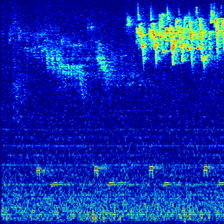

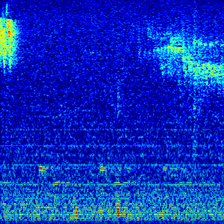

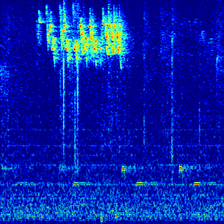

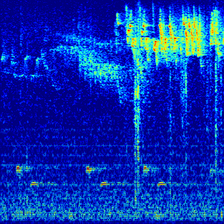

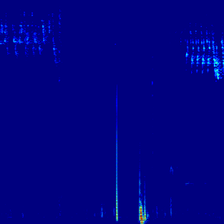

...

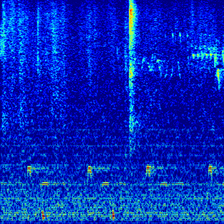

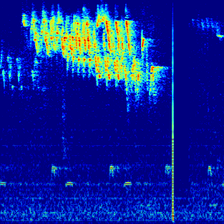

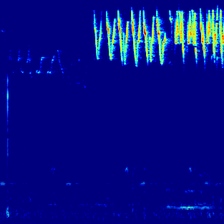

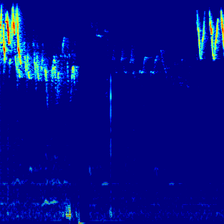

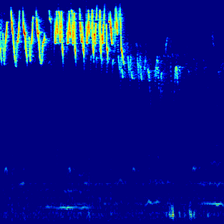

14

In [18]:
spectrograms_for_audio(audio_input_folder+"/grewar3/", "XC24975.ogg", preview=True)

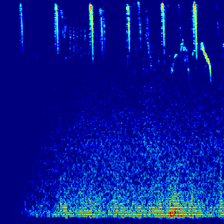

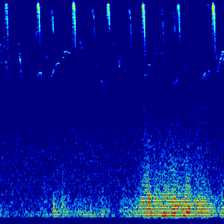

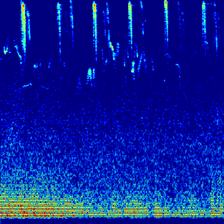

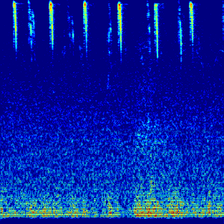

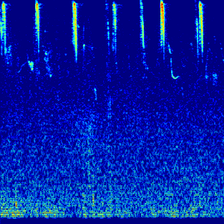

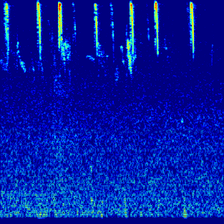

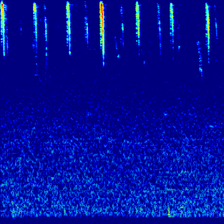

7

In [19]:
spectrograms_for_audio(audio_input_folder+"/zitcis1/", "XC655341.ogg", preview=True)

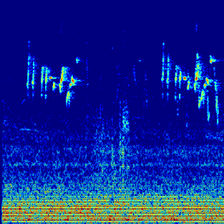

1

In [20]:

spectrograms_for_audio(audio_input_folder+"/bkcbul1/", "XC129030.ogg", preview=True)



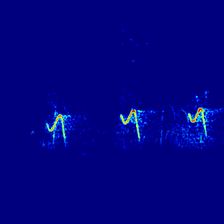

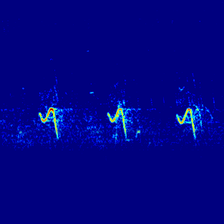

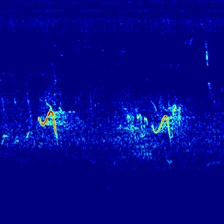

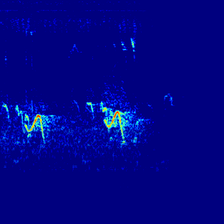

4

In [21]:
spectrograms_for_audio(audio_input_folder+"/asikoe2/", "XC138196.ogg", preview=True)


# Generate the spectrograms!
### 'X' is displayed for any file not processed due to being shorter than audio_duration

In [22]:
species_codes_of_interest = metadata_of_interest['SPECIES_CODE'].tolist()
species_codes_of_interest

['eurcoo',
 'whbwat1',
 'graher1',
 'greegr',
 'litegr',
 'bcnher',
 'rorpar',
 'grtdro1',
 'gyhcaf1',
 'blrwar1',
 'rewbul',
 'grewar3']

In [ ]:
# List everything in the audio input folder
entries = os.listdir(audio_input_folder)

# Filter to get only directories
# subdirectories = [entry for entry in entries if os.path.isdir(os.path.join(audio_input_folder, entry))]
subdirectories = [entry for entry in entries if os.path.isdir(os.path.join(audio_input_folder, entry)) and entry in species_codes_of_interest]

# Sort the directories
subdirectories.sort()

#to start processing at a certain folder offset
subdirectories = subdirectories[start_at_folder_offset:]

folder_count = len(subdirectories)
folders_processed = 0

# Iterate through each sorted directory
total_images = 0
for subdir in subdirectories:
    subdir_path = os.path.join(audio_input_folder, subdir)
    folders_processed += 1
    print("\n", bird_species_from_folder(subdir_path), folders_processed, "/", folder_count)

    # List files in the current directory (in any order)
    filenames = os.listdir(subdir_path)
    
    # Process up to max_audio_input_per_species files
    images_this_species = 0
    for filename in filenames[:max_audio_input_per_species]:
        images_generated = spectrograms_for_audio(subdir_path, filename)
        if images_generated > 0:
            images_this_species += images_generated
            print(".", end = "")
        else:
            print("X", end = "")
    print (f"({images_this_species} images generated)")
    total_images += images_this_species

print ("\n", total_images, "total images generated")
                


 Black-crowned Night-Heron (bcnher) 1 / 12
....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................(3276 images generated)

 Blyth's Reed Warbler (blrwar1) 2 / 12
...............................................................................................................................................................................................................................................................................................................................

/var/folders/md/s3kx95_13hb51505hrc358j00000gn/T/ipykernel_14120/1227577916.py:38: RuntimeWarning: invalid value encountered in divide
  normalized_array = (S_db - np.min(S_db)) / ((np.max(S_db) - np.min(S_db)))


.................

In [ ]:
import shutil
shutil.make_archive('8kHz_folder', 'zip', '../Data/8kHz_spec_images')